In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
from sklearn.preprocessing import StandardScaler

In [2]:
data = pd.read_csv('fetal_health.csv.xls')
data

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
0,120.0,0.000,0.000,0.000,0.000,0.0,0.0,73.0,0.5,43.0,...,62.0,126.0,2.0,0.0,120.0,137.0,121.0,73.0,1.0,2.0
1,132.0,0.006,0.000,0.006,0.003,0.0,0.0,17.0,2.1,0.0,...,68.0,198.0,6.0,1.0,141.0,136.0,140.0,12.0,0.0,1.0
2,133.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.1,0.0,...,68.0,198.0,5.0,1.0,141.0,135.0,138.0,13.0,0.0,1.0
3,134.0,0.003,0.000,0.008,0.003,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,11.0,0.0,137.0,134.0,137.0,13.0,1.0,1.0
4,132.0,0.007,0.000,0.008,0.000,0.0,0.0,16.0,2.4,0.0,...,53.0,170.0,9.0,0.0,137.0,136.0,138.0,11.0,1.0,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2121,140.0,0.000,0.000,0.007,0.000,0.0,0.0,79.0,0.2,25.0,...,137.0,177.0,4.0,0.0,153.0,150.0,152.0,2.0,0.0,2.0
2122,140.0,0.001,0.000,0.007,0.000,0.0,0.0,78.0,0.4,22.0,...,103.0,169.0,6.0,0.0,152.0,148.0,151.0,3.0,1.0,2.0
2123,140.0,0.001,0.000,0.007,0.000,0.0,0.0,79.0,0.4,20.0,...,103.0,170.0,5.0,0.0,153.0,148.0,152.0,4.0,1.0,2.0
2124,140.0,0.001,0.000,0.006,0.000,0.0,0.0,78.0,0.4,27.0,...,103.0,169.0,6.0,0.0,152.0,147.0,151.0,4.0,1.0,2.0


In [3]:
X_train, X_test, y_train, y_test = train_test_split(data.iloc[:, 0:], data.iloc[:, 21:], 
                                                    test_size = 0.2, random_state=42)

In [4]:
train_df = X_train.copy()
train_df['fetal_health'] = y_train
def condition(x):
    if x==1.0:
        return "Normal"
    elif x==2.0:
        return "Suspect"
    else:
        return 'Pathological'

train_df['fetal_health_info'] = train_df['fetal_health'].apply(condition)

train_df.head()

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health,fetal_health_info
1233,125.0,0.000,0.0,0.008,0.000,0.0,0.0,32.0,1.1,3.0,...,147.0,4.0,0.0,126.0,125.0,127.0,2.0,0.0,1.0,Normal
480,140.0,0.000,0.0,0.001,0.000,0.0,0.0,60.0,0.8,32.0,...,199.0,9.0,0.0,141.0,141.0,142.0,3.0,0.0,2.0,Suspect
1111,122.0,0.000,0.0,0.000,0.001,0.0,0.0,20.0,1.8,0.0,...,142.0,1.0,0.0,120.0,119.0,121.0,3.0,0.0,1.0,Normal
1303,137.0,0.005,0.0,0.005,0.002,0.0,0.0,36.0,0.9,0.0,...,178.0,4.0,0.0,148.0,148.0,149.0,9.0,0.0,1.0,Normal
861,142.0,0.003,0.0,0.004,0.000,0.0,0.0,46.0,0.7,27.0,...,159.0,1.0,0.0,150.0,148.0,150.0,1.0,0.0,1.0,Normal


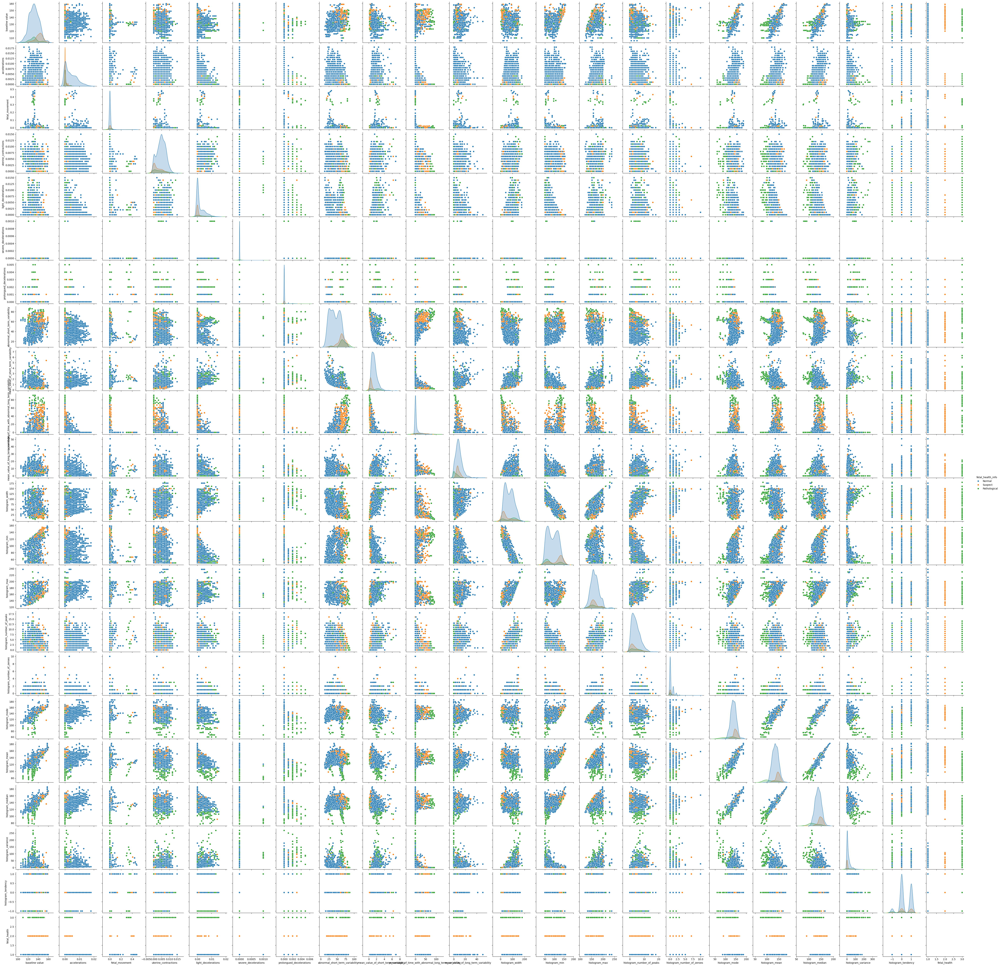

In [5]:
sns.pairplot(train_df, hue='fetal_health_info');

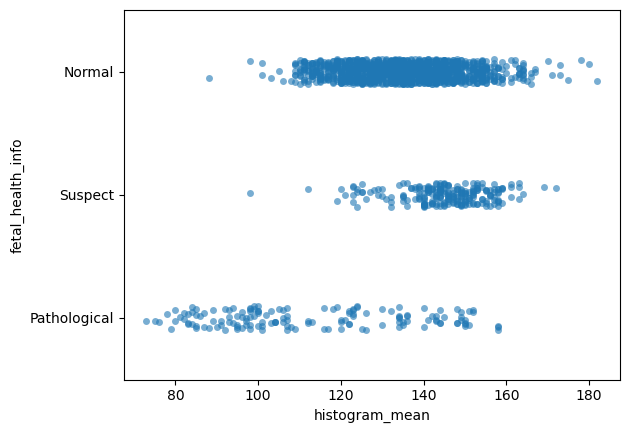

In [7]:
sns.stripplot(x='histogram_mean', y='fetal_health_info', data=train_df, alpha=0.6);

In [8]:
train_df.corr(numeric_only=True)

,baseline value,accelerations,fetal_movement,uterine_contractions,light_decelerations,severe_decelerations,prolongued_decelerations,abnormal_short_term_variability,mean_value_of_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,...,histogram_min,histogram_max,histogram_number_of_peaks,histogram_number_of_zeroes,histogram_mode,histogram_mean,histogram_median,histogram_variance,histogram_tendency,fetal_health
baseline value,1.000000,-0.077611,-0.039079,-0.155961,-0.164129,-0.058210,-0.101142,0.306699,-0.299237,0.302695,...,0.367557,0.270776,-0.130265,-0.020369,0.703465,0.729522,0.784665,-0.139245,0.291174,0.155795
accelerations,-0.077611,1.000000,0.041214,0.088842,-0.107507,-0.048311,-0.126788,-0.273101,0.205745,-0.371637,...,-0.156994,0.393757,0.201050,0.004864,0.250305,0.271833,0.274032,0.121189,0.045295,-0.365704
fetal_movement,-0.039079,0.041214,1.000000,-0.072274,0.048637,-0.012374,0.287641,-0.110378,0.122708,-0.076361,...,-0.157312,0.099697,0.161760,-0.017779,-0.073721,-0.094288,-0.082916,0.186877,-0.003424,0.102929
uterine_contractions,-0.155961,0.088842,-0.072274,1.000000,0.291662,0.006594,0.068701,-0.234998,0.288898,-0.297428,...,-0.101950,0.119860,0.079034,0.055399,-0.103944,-0.194541,-0.144394,0.239429,-0.072694,-0.202329
light_decelerations,-0.164129,-0.107507,0.048637,0.291662,1.000000,0.121616,0.218680,-0.121352,0.551556,-0.269348,...,-0.548267,0.206434,0.386356,0.211434,-0.352216,-0.521751,-0.394304,0.558529,-0.002441,0.076349
severe_decelerations,-0.058210,-0.048311,-0.012374,0.006594,0.121616,1.000000,0.013101,0.038399,0.038599,-0.034250,...,-0.079562,-0.023234,0.008435,0.050992,-0.236630,-0.175503,-0.176365,0.152776,-0.078301,0.145387
prolongued_decelerations,-0.101142,-0.126788,0.287641,0.068701,0.218680,0.013101,1.000000,0.046562,0.277035,-0.136607,...,-0.270380,0.135126,0.233702,0.065868,-0.434940,-0.484820,-0.444754,0.507244,-0.229135,0.493531
abnormal_short_term_variability,0.306699,-0.273101,-0.110378,-0.234998,-0.121352,0.038399,0.046562,1.000000,-0.444328,0.458477,...,0.271553,-0.122976,-0.171359,-0.149610,0.055615,0.079118,0.117623,-0.149767,-0.008540,0.473628
mean_value_of_short_term_variability,-0.299237,0.205745,0.122708,0.288898,0.551556,0.038599,0.277035,-0.444328,1.000000,-0.468515,...,-0.622235,0.406200,0.495113,0.252554,-0.321151,-0.447047,-0.356287,0.547898,-0.076574,-0.078368
percentage_of_time_with_abnormal_long_term_variability,0.302695,-0.371637,-0.076361,-0.297428,-0.269348,-0.034250,-0.136607,0.458477,-0.468515,1.000000,...,0.428959,-0.279618,-0.285453,-0.127698,0.174282,0.231061,0.199106,-0.276668,0.038487,0.409737


In [14]:
lm1 = LogisticRegression()
lm1.fit(X_train[['abnormal_short_term_variability']].values, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [15]:
lm2 = LogisticRegression()
lm2.fit(X_train[['prolongued_decelerations']].values, y_train)

/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


LogisticRegression()

In [25]:
print("Training Accuracy:", round(lm1.score(X_train[['abnormal_short_term_variability']].values, y_train), 3))
print("Testing Accuracy:", round(lm1.score(X_test[['abnormal_short_term_variability']].values, y_test), 3))

Training Accuracy: 0.786
Testing Accuracy: 0.803


In [17]:
print("Training Accuracy:", round(lm2.score(X_train[['prolongued_decelerations']].values, y_train), 3))
print("Testing Accuracy:", round(lm2.score(X_test[['prolongued_decelerations']].values, y_test), 3))

Training Accuracy: 0.778
Testing Accuracy: 0.782


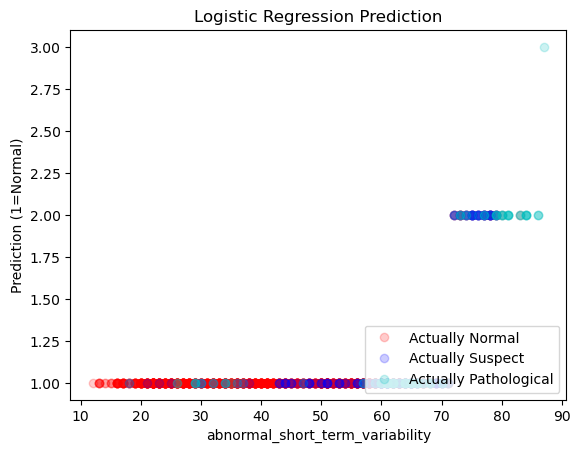

In [28]:
feature = train_df['abnormal_short_term_variability'].values.reshape(-1,1) # Eğitimde kullandığım özellikler
y_pred_train = lm1.predict(feature) # Bu özellikleri input olarak kullanarak tahmin gerçekleştirme

sf_mask = (train_df['fetal_health_info'] == 'Normal')
sf_mask2 = (train_df['fetal_health_info'] == 'Suspect')
sf_mask3 = (train_df['fetal_health_info'] == 'Pathological')

plt.plot(feature[sf_mask], y_pred_train[sf_mask], 'ro', label='Actually Normal', alpha=0.2)
plt.plot(feature[sf_mask2], y_pred_train[sf_mask2], 'bo', label='Actually Suspect', alpha=0.2)
plt.plot(feature[sf_mask3], y_pred_train[sf_mask3], 'co', label='Actually Pathological', alpha=0.2)
plt.xlabel('abnormal_short_term_variability')
plt.ylabel('Prediction (1=Normal)')
plt.title('Logistic Regression Prediction')
plt.legend(loc='lower right');

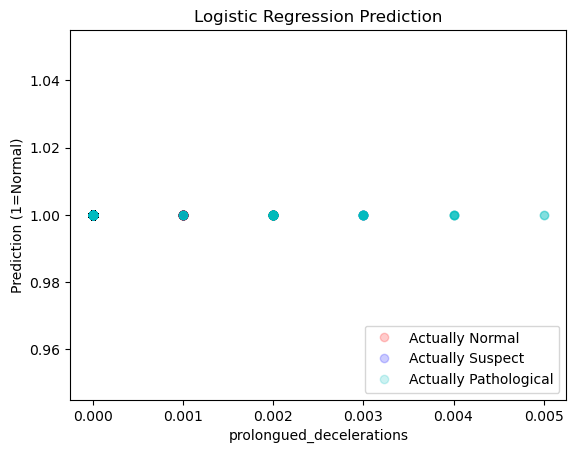

In [32]:
feature = train_df['prolongued_decelerations'].values.reshape(-1,1) # Eğitimde kullandığım özellikler
y_pred_train = lm1.predict(feature) # Bu özellikleri input olarak kullanarak tahmin gerçekleştirme

sf_mask = (train_df['fetal_health_info'] == 'Normal')
sf_mask2 = (train_df['fetal_health_info'] == 'Suspect')
sf_mask3 = (train_df['fetal_health_info'] == 'Pathological')

plt.plot(feature[sf_mask], y_pred_train[sf_mask], 'ro', label='Actually Normal', alpha=0.2)
plt.plot(feature[sf_mask2], y_pred_train[sf_mask2], 'bo', label='Actually Suspect', alpha=0.2)
plt.plot(feature[sf_mask3], y_pred_train[sf_mask3], 'co', label='Actually Pathological', alpha=0.2)
plt.xlabel('prolongued_decelerations')
plt.ylabel('Prediction (1=Normal)')
plt.title('Logistic Regression Prediction')
plt.legend(loc='lower right');

In [20]:
feature = train_df['prolongued_decelerations'].values.reshape(-1,1) # Eğitimde kullandığım özellikler
y_pred_train = lm1.predict(feature) # Bu özellikleri input olarak kullanarak tahmin gerçekleştirme

y_pred_train 

array([1., 1., 1., ..., 1., 1., 1.])

In [21]:
lm1.predict([[73.0],[17.0],[16.0]])

array([2., 1., 1.])

In [22]:
lm1.predict_proba([[73.0],[17.0],[16.0]])[:, 1] 

array([0.37356651, 0.00642468, 0.00586623])

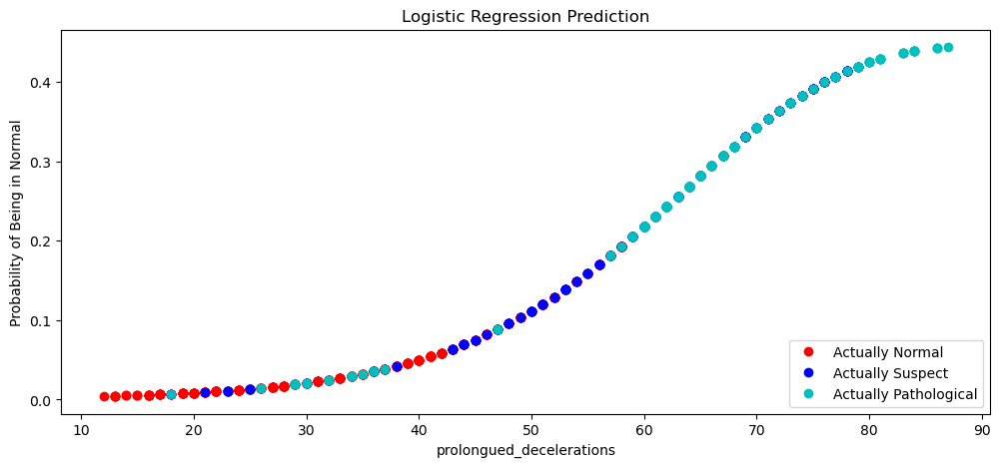

In [39]:
feature = train_df['abnormal_short_term_variability'].values.reshape(-1,1) 
prediction_soft = lm1.predict_proba(feature)[:, 1]
plt.figure(figsize=[12,5])

sf_mask = (train_df['fetal_health_info'] == 'Normal')
sf_mask2 = (train_df['fetal_health_info'] == 'Suspect')
sf_mask3 = (train_df['fetal_health_info'] == 'Pathological')

plt.plot(feature[sf_mask], prediction_soft[sf_mask], 'ro', label='Actually Normal', alpha=1.0)
plt.plot(feature[sf_mask2], prediction_soft[sf_mask2], 'bo', label='Actually Suspect', alpha=1.0)
plt.plot(feature[sf_mask3], prediction_soft[sf_mask3], 'co', label='Actually Pathological', alpha=1.0)

plt.xlabel('prolongued_decelerations')
plt.ylabel('Probability of Being in Normal')
plt.title('Logistic Regression Prediction')
plt.legend(loc='lower right');

In [41]:
y_pred_test = lm1.predict(X_test['abnormal_short_term_variability'].values.reshape(-1,1))
y_pred_test

array([1., 1., 1., 1., 1., 2., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 2., 1., 1., 2., 1., 1., 1., 2., 1., 2., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 2., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 2., 1., 2., 1.,
       1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 2., 1., 1., 1., 1., 2.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2.,
       1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 2., 1., 1.,
       1., 1., 2., 2., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1., 1.,
       1., 1., 1., 1., 1.

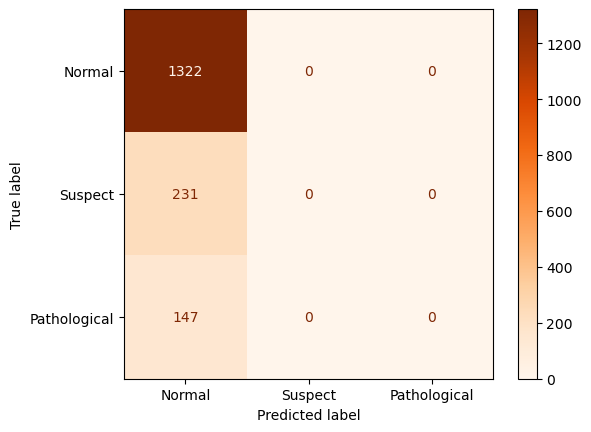

In [42]:
ConfusionMatrixDisplay.from_predictions(y_train, y_pred_train, display_labels=['Normal','Suspect','Pathological'], cmap='Oranges');


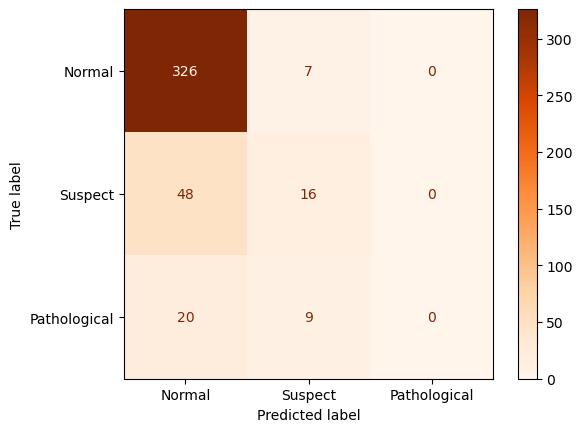

In [43]:
ConfusionMatrixDisplay.from_predictions(y_test, y_pred_test, display_labels=['Normal','Suspect','Pathological'], cmap='Oranges');


In [44]:
minmax_scale = MinMaxScaler()

X_train = train_df[['prolongued_decelerations', 'abnormal_short_term_variability','percentage_of_time_with_abnormal_long_term_variability', 'histogram_variance']]
X_train_scaled = minmax_scale.fit_transform(X_train) # Eğitim veri seti için fit_transform
X_train_scaled = pd.DataFrame(X_train_scaled, columns=X_train.columns)

X_test = X_test[['prolongued_decelerations', 'abnormal_short_term_variability','percentage_of_time_with_abnormal_long_term_variability', 'histogram_variance']]
X_test_scaled = minmax_scale.transform(X_test) # Test veri seti için transform
X_test_scaled = pd.DataFrame(X_test_scaled, columns=X_test.columns)

lm3 = LogisticRegression()
lm3.fit(X_train_scaled, y_train)

print("Training Accuracy:", round(lm3.score(X_train_scaled, y_train),3))
print("Testing Accuracy:", round(lm3.score(X_test_scaled, y_test),3))

Training Accuracy: 0.846
Testing Accuracy: 0.859


/opt/anaconda3/lib/python3.12/site-packages/sklearn/utils/validation.py:1300: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


In [45]:
X_test

,prolongued_decelerations,abnormal_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_variance
282,0.000,46.0,0.0,9.0
1999,0.000,62.0,0.0,29.0
1709,0.001,60.0,0.0,21.0
988,0.000,29.0,0.0,9.0
2018,0.001,64.0,0.0,7.0
...,...,...,...,...
305,0.000,74.0,30.0,1.0
973,0.000,32.0,6.0,70.0
611,0.000,33.0,0.0,10.0
2108,0.000,67.0,0.0,2.0


In [46]:
X_test_scaled

,prolongued_decelerations,abnormal_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_variance
0,0.0,0.453333,0.000000,0.033457
1,0.0,0.666667,0.000000,0.107807
2,0.2,0.640000,0.000000,0.078067
3,0.0,0.226667,0.000000,0.033457
4,0.2,0.693333,0.000000,0.026022
...,...,...,...,...
421,0.0,0.826667,0.329670,0.003717
422,0.0,0.266667,0.065934,0.260223
423,0.0,0.280000,0.000000,0.037175
424,0.0,0.733333,0.000000,0.007435


In [51]:
prolongued_decelerations = 0.001
abnormal_short_term_variability = 60.0
percentage_of_time_with_abnormal_long_term_variability = 0.0
histogram_variance = 21.0

pred_df = pd.DataFrame({

    'prolongued_decelerations': [prolongued_decelerations],
    'abnormal_short_term_variability': [abnormal_short_term_variability],
    'percentage_of_time_with_abnormal_long_term_variability' : [percentage_of_time_with_abnormal_long_term_variability],
    'histogram_variance' : [histogram_variance]    
    })

pred_df

,prolongued_decelerations,abnormal_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_variance
0,0.001,60.0,0.0,21.0


In [52]:
lm3.predict(pred_df)

array([3.])

In [53]:
scaled_pred_df = minmax_scale.transform(pred_df)
scaled_pred_df = pd.DataFrame(scaled_pred_df, columns=pred_df.columns)
lm3.predict(scaled_pred_df)

array([1.])

In [55]:
scaled_pred_df

,prolongued_decelerations,abnormal_short_term_variability,percentage_of_time_with_abnormal_long_term_variability,histogram_variance
0,0.2,0.64,0.0,0.078067


In [54]:

lm3.predict_proba(scaled_pred_df)

array([[0.62703525, 0.20373655, 0.16922819]])